In [ ]:
# ==== CELL 10F: MULTI-POINT PROMPT VISUALIZATION ====

import random

def visualize_multipoint_prompts(num_samples=10):
    """
    Visualize multi-point prompts on sample images with different strategies.
    Shows 10 sample images with colored prompt points for each strategy.
    
    Args:
        num_samples: Number of test images to visualize (default: 10)
    """
    print(f"🎨 Creating multi-point prompt visualizations for {num_samples} samples...")
    
    # Load specialized model
    model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH).to(DEVICE)
    specialized_state = torch.load(SPECIALIZED_MODEL_PATH, map_location=DEVICE)
    model.mask_decoder.load_state_dict(specialized_state)
    model.eval()
    
    # Get test image paths
    test_pairs = get_image_mask_pairs(TEST_IMG_DIR, TEST_MASK_DIR)
    
    # Randomly select samples for visualization
    random.seed(42)
    sample_indices = random.sample(range(len(test_pairs)), min(num_samples, len(test_pairs)))
    
    # Prompt strategies to visualize
    strategies = ['center', 'edge_single', 'multi_grid']
    
    strategy_colors = {
        'center': 'red',
        'edge_single': 'yellow',
        'multi_grid': 'lime'
    }
    
    strategy_markers = {
        'center': '*',
        'edge_single': 'o',
        'multi_grid': '^'
    }
    
    strategy_names = {
        'center': 'Center-of-Mass',
        'edge_single': 'Edge Points',
        'multi_grid': 'Multi-Point Grid'
    }
    
    # Process each sample
    for sample_idx, idx in enumerate(sample_indices):
        img_path, mask_path = test_pairs[idx]
        
        # Load image and mask
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, TARGET_SIZE)
        
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, TARGET_SIZE)
        
        # Create figure with 4 rows × 3 columns
        fig, axes = plt.subplots(4, 3, figsize=(18, 24))
        fig.suptitle(f'Sample {sample_idx + 1}/{num_samples}: Multi-Point Prompt Strategies', 
                     fontsize=16, fontweight='bold')
        
        # Row 0: Original image and ground truth
        axes[0, 0].imshow(image)
        axes[0, 0].set_title('Original Image', fontsize=12, fontweight='bold')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(image)
        axes[0, 1].imshow(mask, alpha=0.5, cmap='Greens')
        axes[0, 1].set_title('Ground Truth Mask', fontsize=12, fontweight='bold')
        axes[0, 1].axis('off')
        
        axes[0, 2].axis('off')
        
        # Prepare image for SAM
        with torch.no_grad():
            input_tensor = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
            embedding = model.image_encoder(input_tensor)
        
        # Process each strategy
        for strategy_idx, strategy in enumerate(strategies):
            row = strategy_idx + 1
            
            # Generate prompts
            config = PROMPT_CONFIGS[strategy]
            strategy_fn = config['fn']
            num_points = config['num_points']
            
            point_coords, point_labels = strategy_fn(mask, num_points=num_points)
            
            if point_coords is None:
                # Fallback to center if strategy fails
                point_coords, point_labels = PromptStrategy.center_of_mass(mask, num_points=1)
            
            # Column 0: Image with prompt points
            axes[row, 0].imshow(image)
            if point_coords is not None:
                for pt in point_coords:
                    axes[row, 0].plot(pt[0], pt[1], 
                                     marker=strategy_markers[strategy],
                                     color=strategy_colors[strategy],
                                     markersize=20,
                                     markeredgewidth=2,
                                     markeredgecolor='black')
            axes[row, 0].set_title(f'{strategy_names[strategy]} Prompts', 
                                  fontsize=12, fontweight='bold')
            axes[row, 0].axis('off')
            
            # Run prediction
            with torch.no_grad():
                sparse_embeddings, dense_embeddings = model.prompt_encoder(
                    points=(
                        torch.from_numpy(point_coords).unsqueeze(0).float().to(DEVICE),
                        torch.from_numpy(point_labels).unsqueeze(0).float().to(DEVICE)
                    ),
                    boxes=None,
                    masks=None
                )
                
                low_res_masks, _ = model.mask_decoder(
                    image_embeddings=embedding,
                    image_pe=model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False
                )
                
                pred_mask = torch.nn.functional.interpolate(
                    low_res_masks,
                    size=TARGET_SIZE,
                    mode='bilinear',
                    align_corners=False
                )
                
                pred_mask = (pred_mask.squeeze().cpu().numpy() > 0).astype(np.uint8) * 255
            
            # Column 1: Prediction overlay
            axes[row, 1].imshow(image)
            axes[row, 1].imshow(pred_mask, alpha=0.5, cmap='Blues')
            axes[row, 1].set_title(f'{strategy_names[strategy]} Prediction', 
                                  fontsize=12, fontweight='bold')
            axes[row, 1].axis('off')
            
            # Column 2: Metrics
            iou = SegmentationMetrics.iou(pred_mask > 128, mask > 128)
            dice = SegmentationMetrics.dice_coefficient(pred_mask > 128, mask > 128)
            boundary = SegmentationMetrics.boundary_precision(pred_mask > 128, mask > 128, threshold_px=5)
            
            metrics_text = f"Metrics:\n\n"
            metrics_text += f"IoU: {iou:.4f}\n"
            metrics_text += f"Dice: {dice:.4f}\n"
            metrics_text += f"Boundary F1: {boundary['f1']:.4f}\n"
            metrics_text += f"Boundary Prec: {boundary['precision']:.4f}\n"
            metrics_text += f"Boundary Rec: {boundary['recall']:.4f}"
            
            axes[row, 2].text(0.1, 0.5, metrics_text, 
                            fontsize=11, 
                            verticalalignment='center',
                            family='monospace',
                            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
            axes[row, 2].set_title('Performance', fontsize=12, fontweight='bold')
            axes[row, 2].axis('off')
        
        plt.tight_layout()
        plt.savefig(f'multipoint_visualization_sample_{sample_idx + 1}.png', 
                   dpi=100, bbox_inches='tight')
        plt.show()
        
        print(f"✓ Sample {sample_idx + 1}/{num_samples} visualized")
    
    print(f"\n✅ Visualization complete! {num_samples} samples saved.")

# Run visualization
print("=" * 80)
print("MULTI-POINT PROMPT VISUALIZATION")
print("=" * 80)
visualize_multipoint_prompts(num_samples=10)


In [ ]:
# ==== CELL 10F: MULTI-POINT PROMPT VISUALIZATION ====
# Visual comparison showing different prompt strategies

def visualize_multipoint_prompts(num_samples=10):
    """
    Visualize how different prompt strategies work on camouflaged objects
    
    For each test image, shows:
    - Original image with each prompt strategy's points overlaid (different colors)
    - Resulting segmentation from specialized model
    
    This helps understand:
    - What multi-point prompts actually look like
    - How the model responds to different prompt types
    - Visual differences between strategies
    """
    
    print("🎨 Generating Multi-Point Prompt Visualizations")
    print("="*80)
    
    # Load specialized model
    spec_model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)
    spec_model.mask_decoder.load_state_dict(torch.load("camo_decoder_vith.pth"))
    spec_model.to(DEVICE)
    spec_model.eval()
    spec_predictor = SamPredictor(spec_model)
    
    # Get test data
    test_pairs = get_image_mask_pairs(TEST_IMG_DIR, TEST_MASK_DIR, max_samples=500)
    
    # Randomly select samples
    random.seed(42)  # Fixed seed for reproducibility
    selected_pairs = random.sample(test_pairs, min(num_samples, len(test_pairs)))
    
    # Define strategies to visualize
    strategies_to_show = ['center', 'edge_single', 'multi_grid']
    
    # Color scheme for different strategies
    strategy_colors = {
        'center': 'red',
        'edge_single': 'yellow', 
        'multi_grid': 'lime'
    }
    
    strategy_markers = {
        'center': '*',
        'edge_single': 'o',
        'multi_grid': '^'
    }
    
    print(f"Visualizing {len(selected_pairs)} samples with {len(strategies_to_show)} prompt strategies")
    print(f"Strategies: {[PROMPT_CONFIGS[s]['name'] for s in strategies_to_show]}")
    print()
    
    for sample_idx, (img_path, mask_path) in enumerate(selected_pairs):
        # Load image and mask
        img = cv2.imread(img_path)
        if img is None:
            continue
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        if mask is None:
            continue
        
        # Resize
        h_orig, w_orig = img.shape[:2]
        img_resized = cv2.resize(img, (TARGET_SIZE, TARGET_SIZE))
        mask_resized = cv2.resize(mask, (TARGET_SIZE, TARGET_SIZE), interpolation=cv2.INTER_NEAREST)
        
        # Check if mask is valid
        ys, xs = np.where(mask_resized > 128)
        if len(xs) == 0:
            continue
        
        # Create figure: 1 row per strategy + 1 for ground truth
        num_rows = len(strategies_to_show) + 1
        fig, axes = plt.subplots(num_rows, 3, figsize=(18, 6 * num_rows))
        
        # Row 0: Ground Truth
        axes[0, 0].imshow(img)
        axes[0, 0].set_title(f"Original Image\n{Path(img_path).name}", fontsize=12, fontweight='bold')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(mask, cmap='gray')
        axes[0, 1].set_title("Ground Truth Mask", fontsize=12, fontweight='bold')
        axes[0, 1].axis('off')
        
        axes[0, 2].axis('off')  # Empty
        
        # Process each strategy
        for strat_idx, strategy_key in enumerate(strategies_to_show):
            row = strat_idx + 1
            config = PROMPT_CONFIGS[strategy_key]
            strategy_func = config['strategy']
            num_points = config['num_points']
            
            # Generate prompts
            point_coords, point_labels = strategy_func(mask_resized, num_points=num_points)
            
            if point_coords is None:
                # Skip if prompt generation fails
                for col in range(3):
                    axes[row, col].axis('off')
                continue
            
            # Column 0: Image with prompt points overlaid
            axes[row, 0].imshow(img_resized)
            
            # Draw prompt points with different colors
            color = strategy_colors.get(strategy_key, 'cyan')
            marker = strategy_markers.get(strategy_key, 'o')
            
            for pt_idx, (px, py) in enumerate(point_coords):
                axes[row, 0].scatter(px, py, c=color, marker=marker, s=400, 
                                    edgecolors='white', linewidths=3, 
                                    label=config['name'] if pt_idx == 0 else '', zorder=10)
            
            axes[row, 0].set_title(f"{config['name']}\n({len(point_coords)} point{'s' if len(point_coords) > 1 else ''})", 
                                  fontsize=11, fontweight='bold')
            axes[row, 0].legend(loc='upper right', fontsize=9)
            axes[row, 0].axis('off')
            
            # Column 1: Prediction from specialized model
            spec_predictor.set_image(img_resized)
            
            try:
                masks, scores, _ = spec_predictor.predict(
                    point_coords=point_coords,
                    point_labels=point_labels,
                    multimask_output=False
                )
                
                # Resize to original size
                pred_resized = cv2.resize(
                    masks[0].astype(np.uint8), 
                    (w_orig, h_orig), 
                    interpolation=cv2.INTER_NEAREST
                )
                
                # Show prediction overlay
                axes[row, 1].imshow(img)
                axes[row, 1].imshow(pred_resized, alpha=0.6, cmap='spring')
                axes[row, 1].set_title("Specialized SAM Prediction", fontsize=11)
                axes[row, 1].axis('off')
                
                # Column 2: Calculate metrics and show
                pred_binary = pred_resized > 0.5
                gt_binary = mask > 128
                
                iou = SegmentationMetrics.iou(pred_binary, gt_binary)
                dice = SegmentationMetrics.dice_coefficient(pred_binary, gt_binary)
                boundary = SegmentationMetrics.boundary_precision(pred_binary, gt_binary, threshold_px=5)
                
                # Display metrics as text
                axes[row, 2].text(0.1, 0.7, f"Metrics:", fontsize=14, fontweight='bold', 
                                 transform=axes[row, 2].transAxes)
                axes[row, 2].text(0.1, 0.55, f"IoU: {iou:.4f}", fontsize=12, 
                                 transform=axes[row, 2].transAxes)
                axes[row, 2].text(0.1, 0.45, f"Dice: {dice:.4f}", fontsize=12,
                                 transform=axes[row, 2].transAxes)
                axes[row, 2].text(0.1, 0.35, f"Boundary F1: {boundary['f1']:.4f}", fontsize=12,
                                 transform=axes[row, 2].transAxes)
                axes[row, 2].text(0.1, 0.25, f"Boundary Prec: {boundary['precision']:.4f}", fontsize=11,
                                 transform=axes[row, 2].transAxes)
                axes[row, 2].text(0.1, 0.15, f"Boundary Rec: {boundary['recall']:.4f}", fontsize=11,
                                 transform=axes[row, 2].transAxes)
                axes[row, 2].set_xlim(0, 1)
                axes[row, 2].set_ylim(0, 1)
                axes[row, 2].axis('off')
                
            except Exception as e:
                axes[row, 1].text(0.5, 0.5, f"Error: {str(e)[:50]}", ha='center', va='center',
                                 transform=axes[row, 1].transAxes)
                axes[row, 1].axis('off')
                axes[row, 2].axis('off')
        
        plt.suptitle(f"Sample {sample_idx + 1}/{len(selected_pairs)}: Multi-Point Prompt Comparison", 
                    fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()
        
        print(f"✓ Displayed sample {sample_idx + 1}/{len(selected_pairs)}")
    
    print()
    print("="*80)
    print(f"✅ Visualization complete! Displayed {len(selected_pairs)} samples")
    print()
    print("💡 Key Observations:")
    print("  • Red stars (*): Center-of-Mass - single point at object center")
    print("  • Yellow circles (o): Edge Points - points on object boundary")
    print("  • Green triangles (^): Multi-Grid - 4 points covering object area")
    print()
    print("Compare the predictions to see how different prompts affect segmentation quality!")

# Run the visualization
print("="*80)
print("MULTI-POINT PROMPT VISUALIZATION")
print("="*80)
print()
print("This visualization shows how the specialized SAM model responds to different")
print("prompt strategies. Each row shows a different prompting approach.")
print()

visualize_multipoint_prompts(num_samples=10)

# Camouflaged Object Detection: Specialized SAM

## Project Goal
Detect camouflaged animals (lizards, moths, insects) that blend into their natural backgrounds.
Base SAM often fails because these objects have **no clear edges**—they're designed by evolution to be invisible.

We will train a **Specialized SAM Decoder** to recognize subtle texture disruptions and 3D shape cues that distinguish animal from background.

## Dataset: COD10K (Camouflaged Object Detection)
- **Train:** ~3,000 images with pixel-level masks.
- **Test:** ~2,000 images.
- **Content:** Animals (lizards, moths, insects, fish) blending into natural scenes.


In [1]:
import kagglehub
path = kagglehub.dataset_download("aarekaz/cod10k")

100%|██████████| 2.26G/2.26G [01:45<00:00, 23.1MB/s]

Extracting files...


In [2]:
# ==== STEP 1: INSTALL DEPENDENCIES ====
try:
    import segment_anything
    print("Segment Anything (Official) already installed.")
except ImportError:
    print("Installing Segment Anything (Official)...")
    %pip install git+https://github.com/facebookresearch/segment-anything.git
    %pip install timm opencv-python huggingface_hub

import os
import cv2
import random
import numpy as np
import pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F

# CHANGED: Import from official library
from segment_anything import sam_model_registry, SamPredictor

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {DEVICE}")

# Fix Seeds for Reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed)

Installing Segment Anything (Official)...
  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-d2ze3qux
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-d2ze3qux
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Created wheel for segment_anything: filename=segment_anything-1.0-py3-none-any.whl size=36592 sha256=1aea9c7b279610e826db000d3ee94391cb16d2bd75d12b79475fe031eed236fd
  Stored in directory: /tmp/pip-ephem-wheel-cache-y4xcraz_/wheels/29/82/ff/04e2be9805a1cb48bec0b85b5a6da6b63f647645750a0e42d4
Successfully built segment_anything
Using device: cuda


In [3]:
# ==== STEP 2: DOWNLOAD COD10K DATASET ====
# We use the path from the previous cell (kagglehub download)

print(f"Dataset path from Step 1: {path}")
# The dataset is nested inside 'COD10K-v3'
DATA_ROOT = Path(path) / 'COD10K-v3'

TRAIN_IMG_DIR = DATA_ROOT / 'Train' / 'Image'
# Updated to GT_Object based on directory structure
TRAIN_MASK_DIR = DATA_ROOT / 'Train' / 'GT_Object'
TEST_IMG_DIR = DATA_ROOT / 'Test' / 'Image'
TEST_MASK_DIR = DATA_ROOT / 'Test' / 'GT_Object'

# Check if paths exist
if not TRAIN_IMG_DIR.exists() or not TRAIN_MASK_DIR.exists():
    print(f"⚠️  Dataset structure mismatch at {DATA_ROOT}")
    print("Listing directory contents:")
    if DATA_ROOT.exists():
        for p in DATA_ROOT.glob('*'):
            print(f"  - {p.name}")
else:
    print(f"✅ Dataset directories found at {DATA_ROOT}")
    print(f"Train Images: {TRAIN_IMG_DIR}")
    print(f"Train Masks:  {TRAIN_MASK_DIR}")

# CHANGED: Download SAM ViT-H (Huge) weights
WEIGHTS_DIR = Path('weights')
WEIGHTS_DIR.mkdir(exist_ok=True)
# Explicitly name it vit_h so we know what we are dealing with
CHECKPOINT_PATH = WEIGHTS_DIR / "sam_vit_h_4b8939.pth"

if not CHECKPOINT_PATH.exists():
    print("Downloading SAM ViT-H weights (2.4GB)...")
    !wget -P weights https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth

print(f"Weights: {CHECKPOINT_PATH}")

Dataset path from Step 1: /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1
✅ Dataset directories found at /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3
Train Images: /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Train/Image
Train Masks:  /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Train/GT_Object
--2025-12-04 00:23:13--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 65.8.76.89, 65.8.76.77, 65.8.76.47, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|65.8.76.89|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘weights/sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   291MB/s    in 8.3s    

2025-12-04 00:23:22 (293 MB/s) - ‘weights/sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]

Weights: weights/sam_vit

In [4]:
# ==== OPTIONAL: LOAD PRE-TRAINED MODEL & DATA FROM HUGGING FACE ====
# RUN THIS CELL ONLY IF you want to SKIP training and use your saved model.
# If you want to train from scratch, SKIP THIS CELL.

from huggingface_hub import hf_hub_download
import zipfile
import os

REPO_ID = "AAREKAZ/SpecialSAM"
print(f"Checking for pre-trained assets from {REPO_ID}...")

files_to_download = [
    "camo_decoder_vith.pth",       # The trained model weights
    "camo_train_meta_vith.csv",    # Metadata for training (optional)
    "camo_embeddings_vith.zip"     # Pre-computed embeddings (saves ~2 hours)
]

for fname in files_to_download:
    if not os.path.exists(fname):
        try:
            print(f"Downloading {fname}...")
            hf_hub_download(repo_id=REPO_ID, filename=fname, repo_type="model", local_dir=".")
        except Exception as e:
            print(f"⚠️ Could not download {fname}: {e}")
    else:
        print(f"Found {fname} locally.")

# Unzip embeddings if downloaded
if os.path.exists("camo_embeddings_vith.zip") and not os.path.exists("camo_embeddings_vith"):
    print("Unzipping embeddings... (This allows skipping Step 4)")
    with zipfile.ZipFile("camo_embeddings_vith.zip", 'r') as z:
        z.extractall(".")

if os.path.exists("camo_decoder_vith.pth"):
    print("\n✅ SUCCESS: Pre-trained model loaded!\n")
    print("Recommended Next Steps:")
    print("1. Run STEP 2 and STEP 3 (to verify dataset paths).")
    print("2. SKIP Step 4 and Step 5.")
    print("3. JUMP to Step 6 (Visual Comparison) or Step 7 (Evaluation).")

Checking for pre-trained assets from AAREKAZ/SpecialSAM...


camo_decoder_vith.pth:   0%|          | 0.00/16.3M [00:00<?, ?B/s]

camo_train_meta_vith.csv: 0.00B [00:00, ?B/s]

camo_embeddings_vith.zip:   0%|          | 0.00/23.1G [00:00<?, ?B/s]

Unzipping embeddings... (This allows skipping Step 4)

✅ SUCCESS: Pre-trained model loaded!

Recommended Next Steps:
1. Run STEP 2 and STEP 3 (to verify dataset paths).
2. SKIP Step 4 and Step 5.
3. JUMP to Step 6 (Visual Comparison) or Step 7 (Evaluation).


Processing Training Set...
Found 6000 images in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Train/Image
Found 6000 masks in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Train/GT_Object
Matched 6000 image-mask pairs.
Showing sample: COD10K-CAM-1-Aquatic-1-BatFish-1.jpg


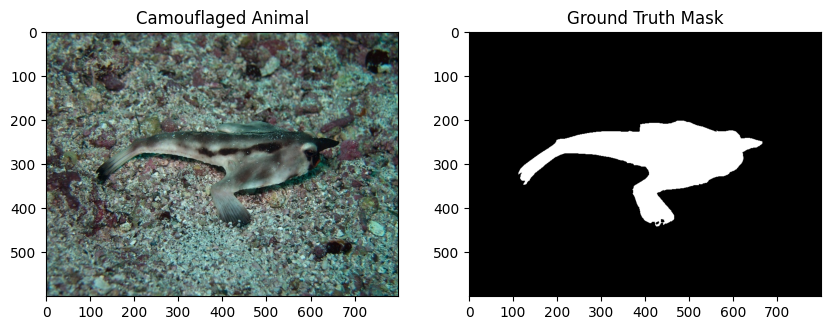

In [5]:
# ==== STEP 3: DATA LOADING & PREPARATION ====

def get_image_mask_pairs(img_dir, mask_dir, max_samples=None):
    """
    Returns list of (image_path, mask_path) tuples.
    Assumes filenames match (ignoring extension).
    """
    # Get all image files
    img_files = sorted(list(img_dir.rglob('*.jpg')) + list(img_dir.rglob('*.png')))
    print(f"Found {len(img_files)} images in {img_dir}")

    # Get all mask files (store as dict for fast lookup: stem -> path)
    mask_files = sorted(list(mask_dir.rglob('*.png')) + list(mask_dir.rglob('*.jpg')))
    mask_map = {p.stem: p for p in mask_files}
    print(f"Found {len(mask_files)} masks in {mask_dir}")

    pairs = []
    for img_path in img_files:
        # Match by filename stem (e.g. 'image_01' matches 'image_01.png')
        if img_path.stem in mask_map:
            pairs.append((str(img_path), str(mask_map[img_path.stem])))

    print(f"Matched {len(pairs)} image-mask pairs.")

    if max_samples:
        pairs = pairs[:max_samples]

    return pairs

# Get Training Pairs (FULL DATASET)
print("Processing Training Set...")
# CHANGED: Removed max_samples=500 to use ALL data
train_pairs = get_image_mask_pairs(TRAIN_IMG_DIR, TRAIN_MASK_DIR)

# Visualize one sample
if len(train_pairs) > 0:
    img_path, mask_path = train_pairs[0]
    print(f"Showing sample: {Path(img_path).name}")
    img = cv2.imread(img_path); img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1); plt.imshow(img); plt.title("Camouflaged Animal")
    plt.subplot(1, 2, 2); plt.imshow(mask, cmap='gray'); plt.title("Ground Truth Mask")
    plt.show()

In [ ]:
# ==== STEP 4: PRE-COMPUTE EMBEDDINGS (WITH AUGMENTATION) ====
# We'll resize images to 1024x1024 and pre-compute embeddings.
# UPGRADE: We now generate a FLIPPED version of each image to double the dataset size.

TARGET_SIZE = 1024
EMBED_DIR = Path('camo_embeddings_vith')
EMBED_DIR.mkdir(exist_ok=True)

# Load Model
print("Loading SAM ViT-H model...")
model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)
model.to(DEVICE)
predictor = SamPredictor(model)

metadata = []
print(f"Pre-computing embeddings for {len(train_pairs)} samples (x2 with Augmentation)...")

for i, (img_path, mask_path) in enumerate(train_pairs):
    # Load & Resize Original
    img = cv2.imread(img_path)
    if img is None: continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img, (TARGET_SIZE, TARGET_SIZE))

    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask_resized = cv2.resize(mask, (TARGET_SIZE, TARGET_SIZE), interpolation=cv2.INTER_NEAREST)

    # Create Flipped Version
    img_flipped = cv2.flip(img_resized, 1)
    mask_flipped = cv2.flip(mask_resized, 1)

    # Process both Original (0) and Flipped (1)
    for aug_idx, (curr_img, curr_mask) in enumerate([(img_resized, mask_resized), (img_flipped, mask_flipped)]):

        # Define Paths
        aug_suffix = "_flip" if aug_idx == 1 else ""
        embed_path = EMBED_DIR / f"train_{i:04d}{aug_suffix}_embed.npy"
        mask_path_save = EMBED_DIR / f"train_{i:04d}{aug_suffix}_mask.npy"

        if not (embed_path.exists() and mask_path_save.exists()):
            # Encode Image
            predictor.set_image(curr_img)
            embedding = predictor.get_image_embedding().cpu().numpy()
            # Save
            np.save(embed_path, embedding)
            np.save(mask_path_save, curr_mask)
        else:
             # If exists, load mask just for metadata calc
             curr_mask = np.load(mask_path_save)

        # Calculate Metadata (Prompt)
        ys, xs = np.where(curr_mask > 128)
        if len(xs) == 0:
             # Skip empty masks
             continue

        # 1. Point Prompt (Random Foreground Point)
        idx_pt = random.randint(0, len(xs) - 1)
        prompt_x, prompt_y = xs[idx_pt], ys[idx_pt]

        # 2. Box Prompt (Bounding Box)
        x_min, x_max = np.min(xs), np.max(xs)
        y_min, y_max = np.min(ys), np.max(ys)

        metadata.append({
            'embed_path': str(embed_path),
            'mask_path': str(mask_path_save),
            'prompt_x': prompt_x,
            'prompt_y': prompt_y,
            'box_xmin': x_min,
            'box_ymin': y_min,
            'box_xmax': x_max,
            'box_ymax': y_max
        })

    if (i+1) % 50 == 0: print(f"Processed {i+1}/{len(train_pairs)} images")

train_df = pd.DataFrame(metadata)
train_df.to_csv('camo_train_meta_vith.csv', index=False)
print(f"Saved metadata for {len(train_df)} augmented samples.")

Loading SAM ViT-H model...
Pre-computing embeddings for 6000 samples (x2 with Augmentation)...
Processed 50/6000 images
Processed 100/6000 images
Processed 150/6000 images
Processed 200/6000 images
Processed 250/6000 images
Processed 300/6000 images
Processed 350/6000 images
Processed 400/6000 images
Processed 450/6000 images
Processed 500/6000 images
Processed 550/6000 images
Processed 600/6000 images
Processed 650/6000 images
Processed 700/6000 images
Processed 750/6000 images
Processed 800/6000 images
Processed 850/6000 images
Processed 900/6000 images
Processed 950/6000 images
Processed 1000/6000 images
Processed 1050/6000 images
Processed 1100/6000 images
Processed 1150/6000 images
Processed 1200/6000 images
Processed 1250/6000 images
Processed 1300/6000 images
Processed 1350/6000 images
Processed 1400/6000 images
Processed 1450/6000 images
Processed 1500/6000 images
Processed 1550/6000 images
Processed 1600/6000 images
Processed 1650/6000 images
Processed 1700/6000 images
Process

In [ ]:
# ==== STEP 5: TRAINING LOOP (MULTI-PROMPT) ====

class CamoDataset(Dataset):
    def __init__(self, df):
        self.df = df

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        # Load Embedding & Mask
        emb = torch.from_numpy(np.load(row['embed_path'])).to(DEVICE)
        mask = np.load(row['mask_path'])
        mask = (mask > 128).astype(np.float32)
        mask = torch.from_numpy(mask).to(DEVICE)

        # Point Prompt
        point = torch.tensor([[row['prompt_x'], row['prompt_y']]], dtype=torch.float32).to(DEVICE)
        label = torch.tensor([1], dtype=torch.int64).to(DEVICE)

        # Box Prompt [x1, y1, x2, y2]
        box = torch.tensor([[row['box_xmin'], row['box_ymin'], row['box_xmax'], row['box_ymax']]], dtype=torch.float32).to(DEVICE)

        return emb, mask.unsqueeze(0), point, label, box

train_ds = CamoDataset(train_df)
train_loader = DataLoader(train_ds, batch_size=1, shuffle=True)

# Setup Model
if 'model' not in globals():
    model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)
    model.to(DEVICE)

model.train()
for p in model.image_encoder.parameters(): p.requires_grad = False
for p in model.prompt_encoder.parameters(): p.requires_grad = False

optimizer = torch.optim.AdamW(model.mask_decoder.parameters(), lr=1e-4)

EPOCHS = 7
print(f"Starting training for {EPOCHS} epochs (Augmented Data + Random Prompts)...")

for epoch in range(EPOCHS):
    total_loss = 0
    for emb, gt_mask, point, label, box in train_loader:
        emb = emb.squeeze(1)

        # UPGRADE: Randomly switch between Point and Box prompts
        # This teaches the model to handle both types of input
        use_box = random.random() > 0.5

        with torch.no_grad():
            if use_box:
                # Use Box Prompt
                sparse, dense = model.prompt_encoder(
                    points=None,
                    boxes=box,
                    masks=None
                )
            else:
                # Use Point Prompt
                sparse, dense = model.prompt_encoder(
                    points=(point, label),
                    boxes=None,
                    masks=None
                )

        low_res_masks, _ = model.mask_decoder(
            image_embeddings=emb,
            image_pe=model.prompt_encoder.get_dense_pe(),
            sparse_prompt_embeddings=sparse,
            dense_prompt_embeddings=dense,
            multimask_output=False
        )

        pred_mask = F.interpolate(low_res_masks, size=(gt_mask.shape[2], gt_mask.shape[3]),
                                  mode='bilinear', align_corners=False)

        # Combined Loss
        bce_loss = F.binary_cross_entropy_with_logits(pred_mask, gt_mask)
        pred = torch.sigmoid(pred_mask)
        intersection = (pred * gt_mask).sum()
        dice_loss = 1 - (2. * intersection + 1.) / (pred.sum() + gt_mask.sum() + 1.)
        loss = 0.5 * bce_loss + 0.5 * dice_loss

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}/{EPOCHS} | Loss: {avg_loss:.4f}")

torch.save(model.mask_decoder.state_dict(), "camo_decoder_vith.pth")
print("Training Complete. Saved.")

Starting training for 7 epochs (Augmented Data + Random Prompts)...
Epoch 1/7 | Loss: 0.1420
Epoch 2/7 | Loss: 0.1272
Epoch 3/7 | Loss: 0.1172
Epoch 4/7 | Loss: 0.1140
Epoch 5/7 | Loss: 0.1113
Epoch 6/7 | Loss: 0.1081
Epoch 7/7 | Loss: 0.1059
Training Complete. Saved.


Found 4000 images in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/Image
Found 4000 masks in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/GT_Object
Matched 4000 image-mask pairs.
Loading models for comparison...
Found 78 unique animals/instances in test set.
Visualizing 10 distinct animals... (Red Star = Prompt Point)


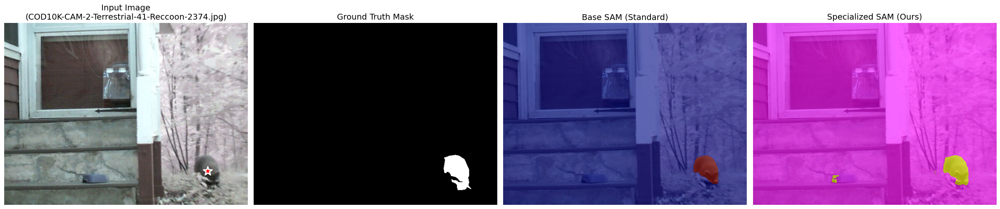

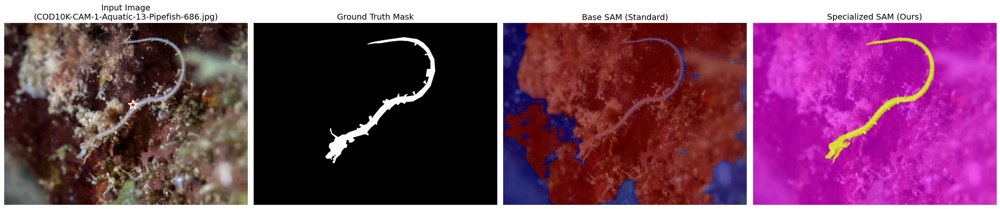

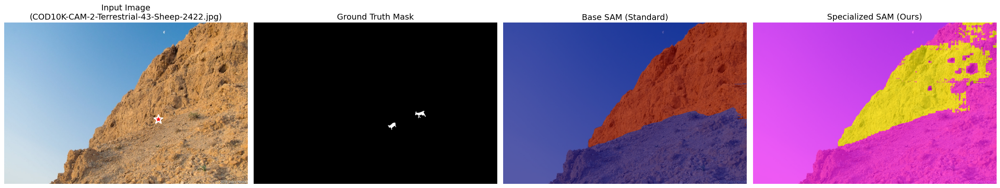

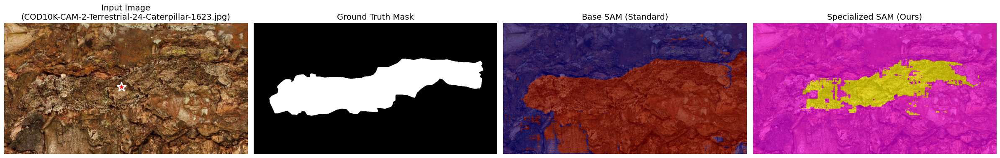

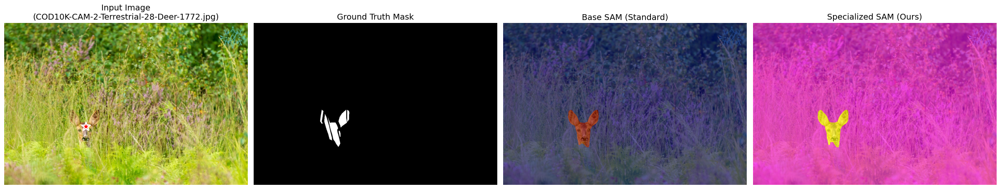

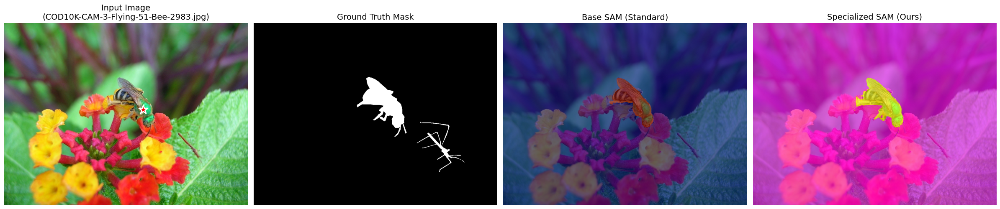

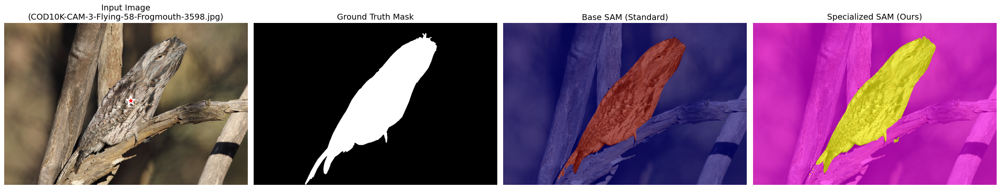

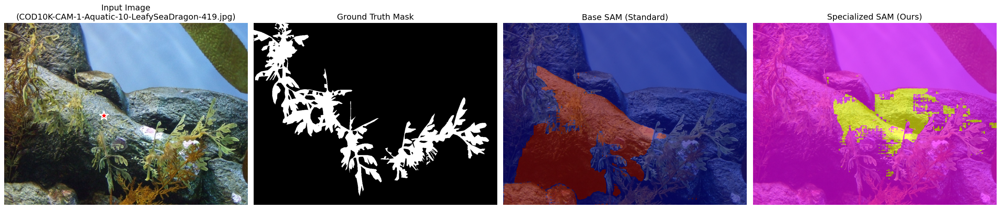

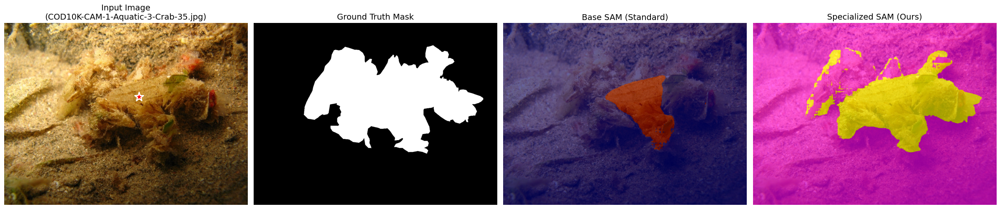

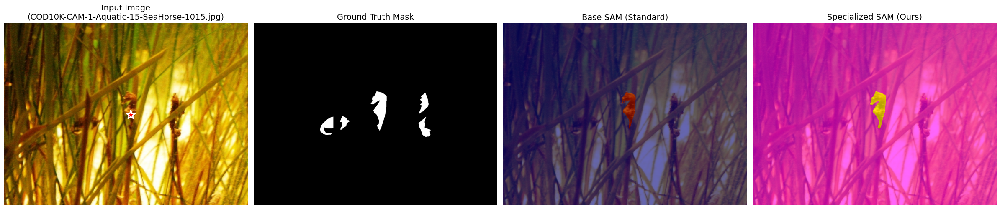

In [6]:
# ==== STEP 6: SIDE-BY-SIDE VISUAL COMPARISON ====

# 1. Get ALL test pairs first
all_test_pairs = get_image_mask_pairs(TEST_IMG_DIR, TEST_MASK_DIR)

def compare_side_by_side(all_pairs, num_samples=10):
    print("Loading models for comparison...")

    # Load Base Model
    base_model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH).to(DEVICE)
    base_model.eval()
    base_predictor = SamPredictor(base_model)

    # Load Specialized Model (Base weights + Fine-tuned Decoder)
    spec_model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)
    spec_model.mask_decoder.load_state_dict(torch.load("camo_decoder_vith.pth"))
    spec_model.to(DEVICE)
    spec_model.eval()
    spec_predictor = SamPredictor(spec_model)

    # --- IMPROVED SELECTION LOGIC ---
    # Group by "Instance" to avoid showing multiple frames of the same animal
    # Filename format: COD10K-CAM-1-Aquatic-1-BatFish-1.jpg
    # Instance ID:     COD10K-CAM-1-Aquatic-1-BatFish

    # Reset random seed for visualization so we get fresh samples on every run
    random.seed(None)

    instances = {}
    for img_path, mask_path in all_pairs:
        stem = Path(img_path).stem
        # Split by '-' and remove the last part (frame number) to get instance ID
        instance_id = "-".join(stem.split("-")[:-1])
        if instance_id not in instances:
            instances[instance_id] = []
        instances[instance_id].append((img_path, mask_path))

    unique_instances = list(instances.keys())
    print(f"Found {len(unique_instances)} unique animals/instances in test set.")

    # Shuffle all instances to search randomly
    random.shuffle(unique_instances)

    print(f"Visualizing {num_samples} distinct animals... (Red Star = Prompt Point)")

    count = 0
    # Iterate through ALL unique instances until we find 'num_samples' valid ones
    for inst_id in unique_instances:
        if count >= num_samples:
            break

        # Pick one random image from this instance
        img_path, mask_path = random.choice(instances[inst_id])

        # Load Images
        try:
            img = cv2.imread(img_path)
            if img is None: continue
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            if mask is None: continue
        except Exception:
            continue

        # Preprocessing
        h, w = img.shape[:2]
        target_size = 1024
        img_resized = cv2.resize(img, (target_size, target_size))

        # Generate Prompt (Center of Object)
        mask_resized = cv2.resize(mask, (target_size, target_size), interpolation=cv2.INTER_NEAREST)
        ys, xs = np.where(mask_resized > 128)
        if len(xs) == 0:
            # Skip without printing to keep output clean
            continue
        cx, cy = int(np.mean(xs)), int(np.mean(ys))

        # --- Run Base Model ---
        base_predictor.set_image(img_resized)
        base_masks, _, _ = base_predictor.predict(
            point_coords=np.array([[cx, cy]]), point_labels=np.array([1]), multimask_output=False
        )
        base_pred = cv2.resize(base_masks[0].astype(np.uint8), (w, h), interpolation=cv2.INTER_NEAREST)

        # --- Run Specialized Model ---
        spec_predictor.set_image(img_resized)
        spec_masks, _, _ = spec_predictor.predict(
            point_coords=np.array([[cx, cy]]), point_labels=np.array([1]), multimask_output=False
        )
        spec_pred = cv2.resize(spec_masks[0].astype(np.uint8), (w, h), interpolation=cv2.INTER_NEAREST)

        # --- Visualization ---
        fig, axes = plt.subplots(1, 4, figsize=(24, 6))

        # 1. Input + Prompt
        axes[0].imshow(img)
        axes[0].scatter(cx * w // target_size, cy * h // target_size, c='red', marker='*', s=250, edgecolors='white', linewidths=2, label='Prompt')
        axes[0].set_title(f"Input Image\n({Path(img_path).name})", fontsize=14)
        axes[0].axis('off')

        # 2. Ground Truth
        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title("Ground Truth Mask", fontsize=14)
        axes[1].axis('off')

        # 3. Base SAM Prediction
        axes[2].imshow(img)
        axes[2].imshow(base_pred, alpha=0.6, cmap='jet')
        axes[2].set_title("Base SAM (Standard)", fontsize=14)
        axes[2].axis('off')

        # 4. Specialized SAM Prediction
        axes[3].imshow(img)
        axes[3].imshow(spec_pred, alpha=0.6, cmap='spring')
        axes[3].set_title("Specialized SAM (Ours)", fontsize=14)
        axes[3].axis('off')

        plt.tight_layout()
        plt.show()

        count += 1

# Run the comparison with 10 samples
compare_side_by_side(all_test_pairs, num_samples=10)

Upload an image and click Detect:


FileUpload(value={}, accept='image/*', description='Upload')

Button(description='Detect Camouflage 🦎', style=ButtonStyle())

Processing uploaded image...


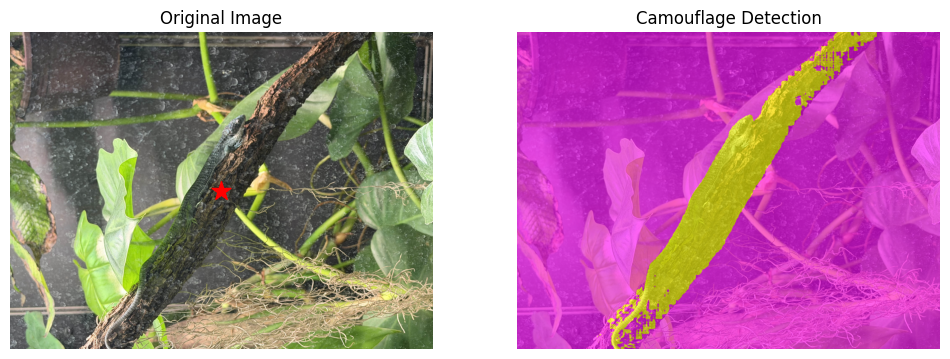

Processing uploaded image...


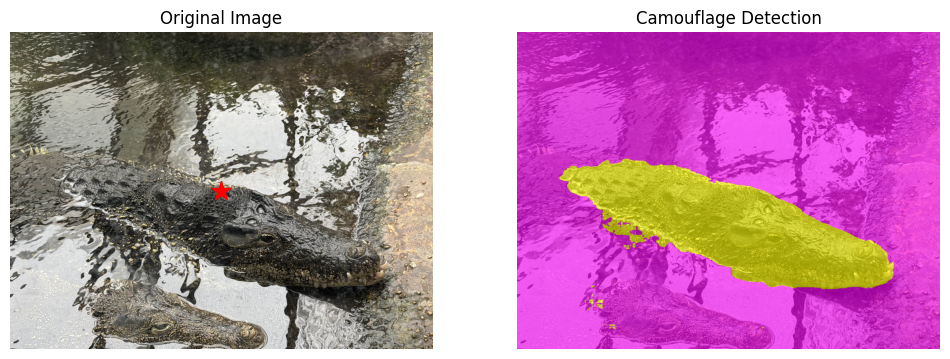

Processing uploaded image...


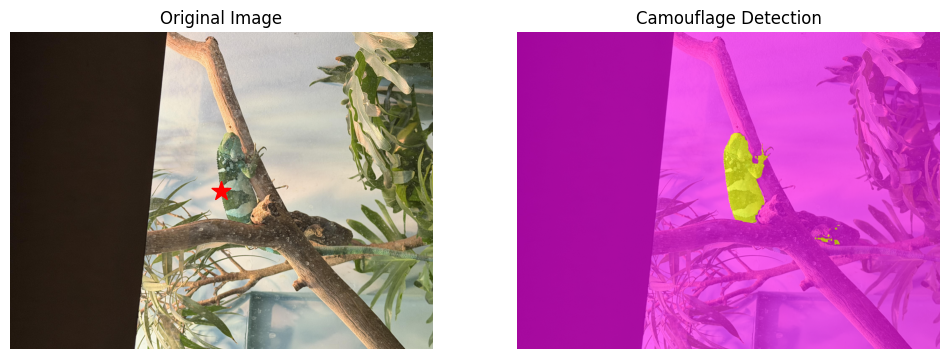

Processing uploaded image...


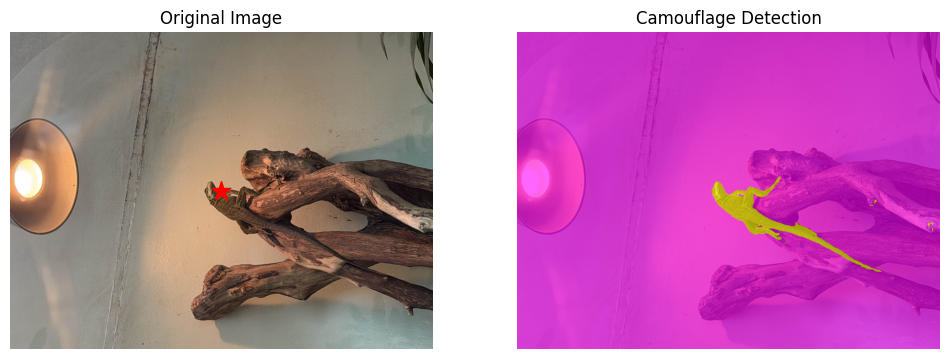

In [ ]:
# ==== STEP 8: INTERACTIVE DEMO ====
# Upload your own image to test the model!

import ipywidgets as widgets
from IPython.display import display
import io

def run_inference(b):
    if not uploader.value:
        print("Please upload an image first!")
        return

    # Get the uploaded image
    # Handle compatibility between ipywidgets versions (dict vs list)
    vals = uploader.value
    if isinstance(vals, dict):
        # Older ipywidgets: returns dict {filename: {metadata}}
        # We grab the first value in the dictionary
        uploaded_file = next(iter(vals.values()))
    else:
        # Newer ipywidgets: returns list/tuple [{metadata}]
        uploaded_file = vals[0]

    content = uploaded_file['content']

    # Convert to numpy
    image = Image.open(io.BytesIO(content)).convert("RGB")
    img_np = np.array(image)

    print(f"Processing uploaded image...")

    # Resize
    target_size = 1024
    img_resized = cv2.resize(img_np, (target_size, target_size))

    # Load Model (Ensure it's loaded)
    if 'spec_predictor' not in globals():
        spec_model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)
        spec_model.mask_decoder.load_state_dict(torch.load("camo_decoder_vith.pth"))
        spec_model.to(DEVICE)
        spec_model.eval()
        globals()['spec_predictor'] = SamPredictor(spec_model)

    predictor = globals()['spec_predictor']
    predictor.set_image(img_resized)

    # Automatic Prompting: Grid of points to find the object
    # Since we don't have a user click, we'll try a center point strategy
    h, w = img_resized.shape[:2]
    cx, cy = w // 2, h // 2

    masks, scores, _ = predictor.predict(
        point_coords=np.array([[cx, cy]]),
        point_labels=np.array([1]),
        multimask_output=False
    )

    # Resize back
    mask = cv2.resize(masks[0].astype(np.uint8), (img_np.shape[1], img_np.shape[0]), interpolation=cv2.INTER_NEAREST)

    # Visualization
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(img_np)
    plt.scatter([img_np.shape[1]//2], [img_np.shape[0]//2], c='red', marker='*', s=200, label='Center Prompt')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img_np)
    plt.imshow(mask, alpha=0.6, cmap='spring')
    plt.title("Camouflage Detection")
    plt.axis('off')
    plt.show()

# UI Components
uploader = widgets.FileUpload(
    accept='image/*',
    multiple=False
)

btn = widgets.Button(description="Detect Camouflage 🦎")
btn.on_click(run_inference)

print("Upload an image and click Detect:")
display(uploader, btn)

In [9]:
# ==== STEP 7: GLOBAL QUANTITATIVE EVALUATION ====
# Calculate mIoU over the entire test set

TARGET_SIZE = 1024 # Define TARGET_SIZE here to ensure it's accessible

def calculate_global_miou(model_type='base', max_samples=None):
    # Setup Predictor
    # CHANGED: Use 'vit_h' instead of 'vit_t'
    net = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)

    if model_type == 'specialized':
        # CHANGED: Load the correct vith weights file
        net.mask_decoder.load_state_dict(torch.load("camo_decoder_vith.pth"))

    net.to(DEVICE)
    net.eval()
    predictor = SamPredictor(net)

    test_pairs_full = get_image_mask_pairs(TEST_IMG_DIR, TEST_MASK_DIR, max_samples=max_samples)
    ious = []
    print(f"Calculating Global mIoU for {model_type} model on {len(test_pairs_full)} samples...")

    for idx, (img_path, mask_path) in enumerate(test_pairs_full):
        img = cv2.imread(img_path); img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        h_orig, w_orig = img.shape[:2]
        img_resized = cv2.resize(img, (TARGET_SIZE, TARGET_SIZE))
        mask_resized = cv2.resize(mask, (TARGET_SIZE, TARGET_SIZE), interpolation=cv2.INTER_NEAREST)

        # Get Prompt
        ys, xs = np.where(mask_resized > 128)
        if len(xs) == 0: continue
        cx, cy = int(np.mean(xs)), int(np.mean(ys))

        # Predict
        predictor.set_image(img_resized)
        masks, _, _ = predictor.predict(
            point_coords=np.array([[cx, cy]]),
            point_labels=np.array([1]),
            multimask_output=False
        )

        # Resize prediction back to original
        pred_resized = cv2.resize(masks[0].astype(np.uint8), (w_orig, h_orig), interpolation=cv2.INTER_NEAREST)

        # Metric
        pred_binary = pred_resized > 0.5
        gt_binary = mask > 128

        intersection = np.logical_and(pred_binary, gt_binary).sum()
        union = np.logical_or(pred_binary, gt_binary).sum()
        iou = intersection / union if union > 0 else 0.0
        ious.append(iou)

        if (idx+1) % 50 == 0: print(f"  Processed {idx+1}/{len(test_pairs_full)}")

    return np.mean(ious)

# Evaluate on subset first (faster), then full set if needed
base_miou = calculate_global_miou('base', max_samples=200)
spec_miou = calculate_global_miou('specialized', max_samples=200)

print(f"\nFinal Camouflage Results (200 samples):")
print(f"Base SAM ViT-H mIoU: {base_miou:.4f}")
print(f"Specialized SAM ViT-H mIoU: {spec_miou:.4f}")
print(f"Improvement: +{(spec_miou - base_miou)*100:.2f}%")

Found 4000 images in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/Image
Found 4000 masks in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/GT_Object
Matched 4000 image-mask pairs.
Calculating Global mIoU for base model on 200 samples...
  Processed 50/200
  Processed 100/200
  Processed 150/200
  Processed 200/200
Found 4000 images in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/Image
Found 4000 masks in /root/.cache/kagglehub/datasets/aarekaz/cod10k/versions/1/COD10K-v3/Test/GT_Object
Matched 4000 image-mask pairs.
Calculating Global mIoU for specialized model on 200 samples...
  Processed 50/200
  Processed 100/200
  Processed 150/200
  Processed 200/200

Final Camouflage Results (200 samples):
Base SAM ViT-H mIoU: 0.4752
Specialized SAM ViT-H mIoU: 0.6635
Improvement: +18.83%


In [ ]:
# ==== CELL 10A: PROMPT DIVERSITY MODULE ====
# Define multiple prompting strategies to test model robustness

from scipy.ndimage import distance_transform_edt

class PromptStrategy:
    """
    Collection of different prompting strategies for SAM.
    Each strategy takes a binary mask and returns point_coords and point_labels.
    """
    
    @staticmethod
    def center_of_mass(mask, num_points=1):
        """
        Baseline: Center of mass prompting
        
        Args:
            mask: Binary mask (H, W)
            num_points: Always 1 for this strategy
        Returns:
            point_coords: np.array([[x, y]]) - single center point
            point_labels: np.array([1]) - positive point
        """
        ys, xs = np.where(mask > 128)
        if len(xs) == 0:
            return None, None
        cx, cy = int(np.mean(xs)), int(np.mean(ys))
        return np.array([[cx, cy]]), np.array([1])
    
    @staticmethod
    def edge_points(mask, num_points=1):
        """
        Edge-based prompting: Select points near object boundary
        
        Why this matters for camouflage:
        - Camouflaged objects have subtle boundaries
        - Edge prompts test model's ability to find boundaries
        - Useful when object center is ambiguous
        
        Args:
            mask: Binary mask (H, W)
            num_points: Number of edge points to sample (default: 1)
        Returns:
            point_coords: np.array([[x1, y1], [x2, y2], ...])
            point_labels: np.array([1, 1, ...]) - all positive
        """
        ys, xs = np.where(mask > 128)
        if len(xs) == 0:
            return None, None
        
        # Find contours
        mask_uint8 = (mask > 128).astype(np.uint8)
        contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        
        if len(contours) == 0:
            # Fallback to center
            return PromptStrategy.center_of_mass(mask, num_points)
        
        # Get largest contour
        contour = max(contours, key=cv2.contourArea)
        
        # Sample points from contour
        if len(contour) < num_points:
            num_points = len(contour)
        
        # Sample evenly spaced points
        indices = np.linspace(0, len(contour)-1, num_points, dtype=int)
        points = [contour[i][0] for i in indices]  # contour format: [[[x, y]]]
        
        point_coords = np.array(points)  # Shape: (num_points, 2)
        point_labels = np.ones(num_points, dtype=int)
        
        return point_coords, point_labels
    
    @staticmethod
    def multi_point_grid(mask, num_points=4):
        """
        Multi-point grid strategy: Sample multiple points in a grid pattern
        
        Why this matters for camouflage:
        - Provides multiple context points
        - Helps with fragmented or irregular objects
        - Tests model's ability to integrate multiple prompts
        
        Args:
            mask: Binary mask (H, W)
            num_points: Target number of points (will use closest perfect square)
        Returns:
            point_coords: np.array([[x1, y1], [x2, y2], ...])
            point_labels: np.array([1, 1, ...])
        """
        ys, xs = np.where(mask > 128)
        if len(xs) == 0:
            return None, None
        
        # Get bounding box
        x_min, x_max = np.min(xs), np.max(xs)
        y_min, y_max = np.min(ys), np.max(ys)
        
        # Create grid (use perfect square)
        grid_size = int(np.sqrt(num_points))
        if grid_size < 1:
            grid_size = 1
        
        # Generate grid points
        x_coords = np.linspace(x_min, x_max, grid_size + 2)[1:-1]  # Exclude edges
        y_coords = np.linspace(y_min, y_max, grid_size + 2)[1:-1]
        
        points = []
        for x in x_coords:
            for y in y_coords:
                # Check if point is inside mask
                xi, yi = int(x), int(y)
                if 0 <= yi < mask.shape[0] and 0 <= xi < mask.shape[1]:
                    if mask[yi, xi] > 128:
                        points.append([xi, yi])
        
        if len(points) == 0:
            # Fallback to center
            return PromptStrategy.center_of_mass(mask, 1)
        
        point_coords = np.array(points)
        point_labels = np.ones(len(points), dtype=int)
        
        return point_coords, point_labels
    
    @staticmethod
    def random_points(mask, num_points=3):
        """
        Random point sampling: Select random points from object
        
        Why this matters:
        - Tests robustness to prompt placement
        - Simulates real-world user clicks
        - Helps detect overfitting to center prompts
        
        Args:
            mask: Binary mask (H, W)
            num_points: Number of random points
        Returns:
            point_coords: np.array([[x1, y1], ...])
            point_labels: np.array([1, 1, ...])
        """
        ys, xs = np.where(mask > 128)
        if len(xs) == 0:
            return None, None
        
        # Sample random indices
        num_available = len(xs)
        num_points = min(num_points, num_available)
        
        indices = np.random.choice(num_available, num_points, replace=False)
        
        point_coords = np.array([[xs[i], ys[i]] for i in indices])
        point_labels = np.ones(num_points, dtype=int)
        
        return point_coords, point_labels


# Define prompt configurations to test
PROMPT_CONFIGS = {
    'center': {
        'name': 'Center-of-Mass (Single)',
        'strategy': PromptStrategy.center_of_mass,
        'num_points': 1,
        'description': 'Original strategy - single point at object center'
    },
    'edge_single': {
        'name': 'Edge (Single)',
        'strategy': PromptStrategy.edge_points,
        'num_points': 1,
        'description': 'Single point on object boundary'
    },
    'multi_grid': {
        'name': 'Multi-Point Grid (4 pts)',
        'strategy': PromptStrategy.multi_point_grid,
        'num_points': 4,
        'description': 'Grid of 4 points covering object'
    },
    'multi_random': {
        'name': 'Multi-Point Random (3 pts)',
        'strategy': PromptStrategy.random_points,
        'num_points': 3,
        'description': 'Three random points from object'
    }
}

print("✅ Prompt Diversity Module Loaded")
print(f"Available strategies: {list(PROMPT_CONFIGS.keys())}")

In [ ]:
# ==== CELL 10B: METRICS MODULE ====
# Comprehensive segmentation metrics for evaluation

class SegmentationMetrics:
    """
    Collection of segmentation metrics for comprehensive evaluation
    """
    
    @staticmethod
    def iou(pred, gt):
        """
        Intersection over Union (IoU / Jaccard Index)
        
        Formula: |A ∩ B| / |A ∪ B|
        
        Range: [0, 1], higher is better
        - 1.0: Perfect overlap
        - 0.0: No overlap
        
        Args:
            pred: Binary prediction (H, W)
            gt: Binary ground truth (H, W)
        Returns:
            float: IoU score
        """
        intersection = np.logical_and(pred, gt).sum()
        union = np.logical_or(pred, gt).sum()
        return float(intersection / union) if union > 0 else 0.0
    
    @staticmethod
    def dice_coefficient(pred, gt):
        """
        Dice Coefficient (F1 Score / Sørensen–Dice coefficient)
        
        Formula: 2 * |A ∩ B| / (|A| + |B|)
        
        Interpretation:
        - Emphasizes overlap more than IoU
        - More sensitive to false positives/negatives
        - Common in medical imaging
        
        Relationship to IoU:
        - Dice = 2*IoU / (1 + IoU)
        - IoU = Dice / (2 - Dice)
        
        Range: [0, 1], higher is better
        
        Args:
            pred: Binary prediction (H, W)
            gt: Binary ground truth (H, W)
        Returns:
            float: Dice coefficient
        """
        intersection = np.logical_and(pred, gt).sum()
        pred_sum = pred.sum()
        gt_sum = gt.sum()
        
        denominator = pred_sum + gt_sum
        if denominator == 0:
            return 1.0 if intersection == 0 else 0.0
        
        return float((2.0 * intersection) / denominator)
    
    @staticmethod
    def f1_score(pred, gt):
        """
        F1 Score (Pixel-wise classification metric)
        
        Formula: 2 * (Precision * Recall) / (Precision + Recall)
        
        Where:
        - Precision = TP / (TP + FP)
        - Recall = TP / (TP + FN)
        - TP = True Positives (pred=1, gt=1)
        - FP = False Positives (pred=1, gt=0)
        - FN = False Negatives (pred=0, gt=1)
        
        Note: In binary segmentation, F1 Score = Dice Coefficient
        (They are mathematically equivalent)
        
        We include both for completeness and clarity of reporting.
        
        Args:
            pred: Binary prediction (H, W)
            gt: Binary ground truth (H, W)
        Returns:
            float: F1 score
        """
        tp = np.logical_and(pred == 1, gt == 1).sum()
        fp = np.logical_and(pred == 1, gt == 0).sum()
        fn = np.logical_and(pred == 0, gt == 1).sum()
        
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
        
        if precision + recall == 0:
            return 0.0
        
        return float(2 * (precision * recall) / (precision + recall))
    
    @staticmethod
    def boundary_precision(pred, gt, threshold_px=5):
        """
        Boundary Precision: Measures accuracy of predicted boundary
        
        Strategy:
        1. Extract boundary pixels from prediction and ground truth
        2. For each predicted boundary pixel, find distance to nearest GT boundary pixel
        3. Count how many predicted boundary pixels are within threshold distance
        4. Precision = (boundary pixels within threshold) / (total predicted boundary pixels)
        
        Why threshold_px=5?
        - Images are 1024x1024
        - Camouflaged objects have fuzzy boundaries
        - 5px ≈ 0.5% of image size
        - Allows small localization errors while penalizing large mistakes
        - Empirically reasonable for segmentation tasks
        
        Alternative thresholds to consider:
        - 2px: Strict (for high-quality annotations)
        - 5px: Moderate (recommended for camouflage)
        - 10px: Lenient (for very ambiguous boundaries)
        
        Args:
            pred: Binary prediction (H, W)
            gt: Binary ground truth (H, W)
            threshold_px: Distance threshold in pixels (default: 5)
        Returns:
            dict: {
                'precision': float,  # [0, 1]
                'recall': float,     # [0, 1]
                'f1': float          # harmonic mean
            }
        """
        # Extract boundaries using morphological operations
        # Boundary = pixels on edge of object (has background neighbor)
        
        # Get boundaries using Canny edge detection
        pred_boundary = cv2.Canny((pred * 255).astype(np.uint8), 100, 200) > 0
        gt_boundary = cv2.Canny((gt * 255).astype(np.uint8), 100, 200) > 0
        
        # Handle empty boundary case
        if not pred_boundary.any():
            return {'precision': 0.0, 'recall': 0.0, 'f1': 0.0}
        if not gt_boundary.any():
            return {'precision': 0.0, 'recall': 0.0, 'f1': 0.0}
        
        # Compute distance transforms
        # Distance from each pixel to nearest boundary pixel
        dist_pred_to_gt = distance_transform_edt(~gt_boundary)
        dist_gt_to_pred = distance_transform_edt(~pred_boundary)
        
        # Precision: What fraction of predicted boundary is close to GT?
        pred_boundary_coords = np.where(pred_boundary)
        distances_pred = dist_pred_to_gt[pred_boundary_coords]
        precision = np.mean(distances_pred <= threshold_px)
        
        # Recall: What fraction of GT boundary is recovered?
        gt_boundary_coords = np.where(gt_boundary)
        distances_gt = dist_gt_to_pred[gt_boundary_coords]
        recall = np.mean(distances_gt <= threshold_px)
        
        # F1: Harmonic mean
        if precision + recall == 0:
            f1 = 0.0
        else:
            f1 = 2 * (precision * recall) / (precision + recall)
        
        return {
            'precision': float(precision),
            'recall': float(recall),
            'f1': float(f1)
        }


print("✅ Metrics Module Loaded")
print("Available metrics:")
print("  - IoU (Intersection over Union)")
print("  - Dice Coefficient")
print("  - F1 Score")
print("  - Boundary Precision (with recall and F1)")

In [ ]:
# ==== CELL 10F: MULTI-POINT PROMPT VISUALIZATION ====

import random

def visualize_multipoint_prompts(num_samples=10):
    """
    Visualize multi-point prompts on sample images with different strategies.
    Shows 10 sample images with colored prompt points for each strategy.
    
    Args:
        num_samples: Number of test images to visualize (default: 10)
    """
    print(f"🎨 Creating multi-point prompt visualizations for {num_samples} samples...")
    
    # Load specialized model
    model = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH).to(DEVICE)
    specialized_state = torch.load("camo_decoder_vith.pth", map_location=DEVICE)
    model.mask_decoder.load_state_dict(specialized_state)
    model.eval()
    
    # Get test image paths
    test_pairs = get_image_mask_pairs(TEST_IMG_DIR, TEST_MASK_DIR)
    
    # Randomly select samples for visualization
    random.seed(42)
    sample_indices = random.sample(range(len(test_pairs)), min(num_samples, len(test_pairs)))
    
    # Prompt strategies to visualize
    strategies = ['center', 'edge_single', 'multi_grid']
    
    strategy_colors = {
        'center': 'red',
        'edge_single': 'yellow',
        'multi_grid': 'lime'
    }
    
    strategy_markers = {
        'center': '*',
        'edge_single': 'o',
        'multi_grid': '^'
    }
    
    strategy_names = {
        'center': 'Center-of-Mass',
        'edge_single': 'Edge Points',
        'multi_grid': 'Multi-Point Grid'
    }
    
    # Process each sample
    for sample_idx, idx in enumerate(sample_indices):
        img_path, mask_path = test_pairs[idx]
        
        # Load image and mask
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, TARGET_SIZE)
        
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, TARGET_SIZE)
        
        # Create figure with 4 rows × 3 columns
        fig, axes = plt.subplots(4, 3, figsize=(18, 24))
        fig.suptitle(f'Sample {sample_idx + 1}/{num_samples}: Multi-Point Prompt Strategies', 
                     fontsize=16, fontweight='bold')
        
        # Row 0: Original image and ground truth
        axes[0, 0].imshow(image)
        axes[0, 0].set_title('Original Image', fontsize=12, fontweight='bold')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(image)
        axes[0, 1].imshow(mask, alpha=0.5, cmap='Greens')
        axes[0, 1].set_title('Ground Truth Mask', fontsize=12, fontweight='bold')
        axes[0, 1].axis('off')
        
        axes[0, 2].axis('off')
        
        # Prepare image for SAM
        with torch.no_grad():
            input_tensor = torch.from_numpy(image).permute(2, 0, 1).unsqueeze(0).to(DEVICE)
            embedding = model.image_encoder(input_tensor)
        
        # Process each strategy
        for strategy_idx, strategy in enumerate(strategies):
            row = strategy_idx + 1
            
            # Generate prompts
            config = PROMPT_CONFIGS[strategy]
            strategy_fn = config['fn']
            num_points = config['num_points']
            
            point_coords, point_labels = strategy_fn(mask, num_points=num_points)
            
            if point_coords is None:
                # Fallback to center if strategy fails
                point_coords, point_labels = PromptStrategy.center_of_mass(mask, num_points=1)
            
            # Column 0: Image with prompt points
            axes[row, 0].imshow(image)
            if point_coords is not None:
                for pt in point_coords:
                    axes[row, 0].plot(pt[0], pt[1], 
                                     marker=strategy_markers[strategy],
                                     color=strategy_colors[strategy],
                                     markersize=20,
                                     markeredgewidth=2,
                                     markeredgecolor='black')
            axes[row, 0].set_title(f'{strategy_names[strategy]} Prompts', 
                                  fontsize=12, fontweight='bold')
            axes[row, 0].axis('off')
            
            # Run prediction
            with torch.no_grad():
                sparse_embeddings, dense_embeddings = model.prompt_encoder(
                    points=(
                        torch.from_numpy(point_coords).unsqueeze(0).float().to(DEVICE),
                        torch.from_numpy(point_labels).unsqueeze(0).float().to(DEVICE)
                    ),
                    boxes=None,
                    masks=None
                )
                
                low_res_masks, _ = model.mask_decoder(
                    image_embeddings=embedding,
                    image_pe=model.prompt_encoder.get_dense_pe(),
                    sparse_prompt_embeddings=sparse_embeddings,
                    dense_prompt_embeddings=dense_embeddings,
                    multimask_output=False
                )
                
                pred_mask = torch.nn.functional.interpolate(
                    low_res_masks,
                    size=TARGET_SIZE,
                    mode='bilinear',
                    align_corners=False
                )
                
                pred_mask = (pred_mask.squeeze().cpu().numpy() > 0).astype(np.uint8) * 255
            
            # Column 1: Prediction overlay
            axes[row, 1].imshow(image)
            axes[row, 1].imshow(pred_mask, alpha=0.5, cmap='Blues')
            axes[row, 1].set_title(f'{strategy_names[strategy]} Prediction', 
                                  fontsize=12, fontweight='bold')
            axes[row, 1].axis('off')
            
            # Column 2: Metrics
            iou = SegmentationMetrics.iou(pred_mask > 128, mask > 128)
            dice = SegmentationMetrics.dice_coefficient(pred_mask > 128, mask > 128)
            boundary = SegmentationMetrics.boundary_precision(pred_mask > 128, mask > 128, threshold_px=5)
            
            metrics_text = f"Metrics:\n\n"
            metrics_text += f"IoU: {iou:.4f}\n"
            metrics_text += f"Dice: {dice:.4f}\n"
            metrics_text += f"Boundary F1: {boundary['f1']:.4f}\n"
            metrics_text += f"Boundary Prec: {boundary['precision']:.4f}\n"
            metrics_text += f"Boundary Rec: {boundary['recall']:.4f}"
            
            axes[row, 2].text(0.1, 0.5, metrics_text, 
                            fontsize=11, 
                            verticalalignment='center',
                            family='monospace',
                            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
            axes[row, 2].set_title('Performance', fontsize=12, fontweight='bold')
            axes[row, 2].axis('off')
        
        plt.tight_layout()
        plt.savefig(f'multipoint_visualization_sample_{sample_idx + 1}.png', 
                   dpi=100, bbox_inches='tight')
        plt.show()
        
        print(f"✓ Sample {sample_idx + 1}/{num_samples} visualized")
    
    print(f"\n✅ Visualization complete! {num_samples} samples saved.")

# Run visualization
print("=" * 80)
print("MULTI-POINT PROMPT VISUALIZATION")
print("=" * 80)
visualize_multipoint_prompts(num_samples=10)

In [ ]:
# ==== CELL 10C: COMPREHENSIVE EVALUATION FUNCTION ====
# Run evaluation across multiple prompt strategies and metrics

def evaluate_comprehensive(
    model_type='base',
    prompt_strategies=['center', 'edge_single', 'multi_grid'],
    max_samples=200,
    boundary_threshold=5,
    verbose=True
):
    """
    Comprehensive evaluation across multiple prompt types and metrics
    
    Args:
        model_type: 'base' or 'specialized'
        prompt_strategies: List of strategy keys from PROMPT_CONFIGS
        max_samples: Number of test samples to evaluate
        boundary_threshold: Distance threshold for boundary precision (pixels)
        verbose: Print progress updates
    
    Returns:
        DataFrame with columns:
        - prompt_strategy: Strategy name
        - iou_mean: Mean IoU
        - iou_std: Std dev of IoU
        - dice_mean: Mean Dice coefficient
        - dice_std: Std dev of Dice
        - f1_mean: Mean F1 score
        - f1_std: Std dev of F1
        - boundary_prec_mean: Mean boundary precision
        - boundary_prec_std: Std dev of boundary precision
        - boundary_recall_mean: Mean boundary recall
        - boundary_f1_mean: Mean boundary F1
        - num_samples: Number of valid samples processed
    """
    
    # Setup model
    net = sam_model_registry['vit_h'](checkpoint=CHECKPOINT_PATH)
    if model_type == 'specialized':
        net.mask_decoder.load_state_dict(torch.load("camo_decoder_vith.pth"))
    net.to(DEVICE)
    net.eval()
    predictor = SamPredictor(net)
    
    # Get test data
    test_pairs = get_image_mask_pairs(TEST_IMG_DIR, TEST_MASK_DIR, max_samples=max_samples)
    
    # Results storage
    results = []
    
    if verbose:
        print(f"\n{'='*60}")
        print(f"Evaluating {model_type.upper()} model")
        print(f"Test samples: {len(test_pairs)}")
        print(f"Prompt strategies: {prompt_strategies}")
        print(f"{'='*60}\n")
    
    # Iterate over prompt strategies
    for strategy_key in prompt_strategies:
        if strategy_key not in PROMPT_CONFIGS:
            print(f"⚠️  Unknown strategy: {strategy_key}, skipping...")
            continue
        
        config = PROMPT_CONFIGS[strategy_key]
        strategy_func = config['strategy']
        num_points = config['num_points']
        
        if verbose:
            print(f"Testing: {config['name']}")
            print(f"  Description: {config['description']}")
        
        # Metrics storage for this strategy
        ious = []
        dices = []
        f1s = []
        boundary_precs = []
        boundary_recalls = []
        boundary_f1s = []
        
        # Process each test image
        for idx, (img_path, mask_path) in enumerate(test_pairs):
            # Load and preprocess
            img = cv2.imread(img_path)
            if img is None: continue
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            if mask is None: continue
            
            h_orig, w_orig = img.shape[:2]
            img_resized = cv2.resize(img, (TARGET_SIZE, TARGET_SIZE))
            mask_resized = cv2.resize(mask, (TARGET_SIZE, TARGET_SIZE), interpolation=cv2.INTER_NEAREST)
            
            # Generate prompt using current strategy
            point_coords, point_labels = strategy_func(mask_resized, num_points=num_points)
            
            if point_coords is None:
                # Skip empty masks
                continue
            
            # Run prediction
            predictor.set_image(img_resized)
            
            try:
                masks, _, _ = predictor.predict(
                    point_coords=point_coords,
                    point_labels=point_labels,
                    multimask_output=False
                )
                
                # Resize prediction to original size
                pred_resized = cv2.resize(
                    masks[0].astype(np.uint8), 
                    (w_orig, h_orig), 
                    interpolation=cv2.INTER_NEAREST
                )
                
                # Binarize
                pred_binary = pred_resized > 0.5
                gt_binary = mask > 128
                
                # Calculate all metrics
                iou = SegmentationMetrics.iou(pred_binary, gt_binary)
                dice = SegmentationMetrics.dice_coefficient(pred_binary, gt_binary)
                f1 = SegmentationMetrics.f1_score(pred_binary, gt_binary)
                boundary = SegmentationMetrics.boundary_precision(
                    pred_binary, gt_binary, threshold_px=boundary_threshold
                )
                
                # Store results
                ious.append(iou)
                dices.append(dice)
                f1s.append(f1)
                boundary_precs.append(boundary['precision'])
                boundary_recalls.append(boundary['recall'])
                boundary_f1s.append(boundary['f1'])
                
            except Exception as e:
                if verbose:
                    print(f"  ⚠️  Error on sample {idx}: {e}")
                continue
            
            # Progress update
            if verbose and (idx + 1) % 50 == 0:
                print(f"  Processed {idx + 1}/{len(test_pairs)}")
        
        # Aggregate results for this strategy
        if len(ious) > 0:
            result = {
                'prompt_strategy': config['name'],
                'iou_mean': np.mean(ious),
                'iou_std': np.std(ious),
                'dice_mean': np.mean(dices),
                'dice_std': np.std(dices),
                'f1_mean': np.mean(f1s),
                'f1_std': np.std(f1s),
                'boundary_prec_mean': np.mean(boundary_precs),
                'boundary_prec_std': np.std(boundary_precs),
                'boundary_recall_mean': np.mean(boundary_recalls),
                'boundary_f1_mean': np.mean(boundary_f1s),
                'num_samples': len(ious)
            }
            results.append(result)
            
            if verbose:
                print(f"  ✅ Results: mIoU={result['iou_mean']:.4f}, "
                      f"Dice={result['dice_mean']:.4f}, "
                      f"Boundary-F1={result['boundary_f1_mean']:.4f}")
                print()
        else:
            if verbose:
                print(f"  ⚠️  No valid samples for this strategy\n")
    
    return pd.DataFrame(results)


print("✅ Comprehensive Evaluation Function Loaded")

In [ ]:
# ==== CELL 10D: RUN COMPREHENSIVE EVALUATION ====
# Execute evaluation on both base and specialized models

# Configuration
PROMPT_STRATEGIES = ['center', 'edge_single', 'multi_grid']
NUM_SAMPLES = 200  # Same as original Cell 10 for fair comparison
BOUNDARY_THRESHOLD = 5  # 5 pixels for camouflage detection

print("🚀 Starting Comprehensive Evaluation...")
print(f"Strategies: {PROMPT_STRATEGIES}")
print(f"Samples: {NUM_SAMPLES}")
print(f"Boundary threshold: {BOUNDARY_THRESHOLD}px\n")

# Evaluate Base Model
print("=" * 70)
print("EVALUATING BASE SAM MODEL")
print("=" * 70)
base_results = evaluate_comprehensive(
    model_type='base',
    prompt_strategies=PROMPT_STRATEGIES,
    max_samples=NUM_SAMPLES,
    boundary_threshold=BOUNDARY_THRESHOLD,
    verbose=True
)
base_results['model'] = 'Base SAM ViT-H'

# Evaluate Specialized Model
print("\n" + "=" * 70)
print("EVALUATING SPECIALIZED SAM MODEL")
print("=" * 70)
spec_results = evaluate_comprehensive(
    model_type='specialized',
    prompt_strategies=PROMPT_STRATEGIES,
    max_samples=NUM_SAMPLES,
    boundary_threshold=BOUNDARY_THRESHOLD,
    verbose=True
)
spec_results['model'] = 'Specialized SAM ViT-H'

# Combine results
combined_results = pd.concat([base_results, spec_results], ignore_index=True)

# Reorder columns for readability
column_order = [
    'model', 'prompt_strategy', 
    'iou_mean', 'iou_std',
    'dice_mean', 'dice_std',
    'f1_mean', 'f1_std',
    'boundary_prec_mean', 'boundary_prec_std',
    'boundary_recall_mean', 'boundary_f1_mean',
    'num_samples'
]
combined_results = combined_results[column_order]

# Save to CSV
combined_results.to_csv('comprehensive_evaluation_results.csv', index=False)
print("\n✅ Results saved to 'comprehensive_evaluation_results.csv'")

# Display results
print("\n" + "=" * 70)
print("COMPREHENSIVE EVALUATION RESULTS")
print("=" * 70)
display(combined_results)

In [ ]:
# ==== CELL 10E: COMPARISON TABLES & VISUALIZATIONS ====
# Generate publication-ready comparison tables and visualizations

def create_comparison_table(df):
    """
    Create formatted comparison table showing:
    1. Model comparison across prompt types
    2. Improvement analysis
    3. Bar chart visualizations
    """
    
    # === TABLE 1: Main Results ===
    print("\n" + "=" * 100)
    print("TABLE 1: COMPREHENSIVE METRIC COMPARISON")
    print("=" * 100)
    print()
    
    # Format for display
    display_df = df.copy()
    
    # Format numeric columns to 4 decimal places
    numeric_cols = ['iou_mean', 'dice_mean', 'f1_mean', 'boundary_prec_mean', 
                    'boundary_recall_mean', 'boundary_f1_mean']
    for col in numeric_cols:
        display_df[col] = display_df[col].apply(lambda x: f"{x:.4f}")
    
    # Format std columns
    std_cols = ['iou_std', 'dice_std', 'f1_std', 'boundary_prec_std']
    for col in std_cols:
        display_df[col] = display_df[col].apply(lambda x: f"±{x:.4f}")
    
    # Select key columns for main table
    main_cols = ['model', 'prompt_strategy', 'iou_mean', 'dice_mean', 
                 'boundary_f1_mean', 'num_samples']
    main_table = display_df[main_cols].copy()
    main_table.columns = ['Model', 'Prompt Type', 'mIoU', 'Dice', 'Boundary F1', 'N']
    
    print(main_table.to_string(index=False))
    print()
    
    # === TABLE 2: Improvement Analysis ===
    print("\n" + "=" * 100)
    print("TABLE 2: SPECIALIZED MODEL IMPROVEMENT OVER BASE")
    print("=" * 100)
    print()
    
    # Calculate improvements for each prompt strategy
    improvements = []
    for strategy in df['prompt_strategy'].unique():
        base = df[(df['model'] == 'Base SAM ViT-H') & (df['prompt_strategy'] == strategy)]
        spec = df[(df['model'] == 'Specialized SAM ViT-H') & (df['prompt_strategy'] == strategy)]
        
        if len(base) > 0 and len(spec) > 0:
            base_row = base.iloc[0]
            spec_row = spec.iloc[0]
            
            improvements.append({
                'Prompt Type': strategy,
                'ΔmIoU': spec_row['iou_mean'] - base_row['iou_mean'],
                'ΔmIoU (%)': ((spec_row['iou_mean'] - base_row['iou_mean']) / base_row['iou_mean']) * 100,
                'ΔDice': spec_row['dice_mean'] - base_row['dice_mean'],
                'ΔDice (%)': ((spec_row['dice_mean'] - base_row['dice_mean']) / base_row['dice_mean']) * 100,
                'ΔBoundary-F1': spec_row['boundary_f1_mean'] - base_row['boundary_f1_mean'],
                'ΔBoundary-F1 (%)': ((spec_row['boundary_f1_mean'] - base_row['boundary_f1_mean']) / 
                                      base_row['boundary_f1_mean']) * 100 if base_row['boundary_f1_mean'] > 0 else 0
            })
    
    improvement_df = pd.DataFrame(improvements)
    
    # Format for display
    for col in ['ΔmIoU', 'ΔDice', 'ΔBoundary-F1']:
        improvement_df[col] = improvement_df[col].apply(lambda x: f"{x:+.4f}")
    for col in ['ΔmIoU (%)', 'ΔDice (%)', 'ΔBoundary-F1 (%)']:
        improvement_df[col] = improvement_df[col].apply(lambda x: f"{x:+.2f}%")
    
    print(improvement_df.to_string(index=False))
    print()
    
    # === VISUALIZATION: Bar Chart Comparison ===
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    strategies = df['prompt_strategy'].unique()
    x = np.arange(len(strategies))
    width = 0.35
    
    metrics = [
        ('iou_mean', 'Mean IoU'),
        ('dice_mean', 'Dice Coefficient'),
        ('boundary_f1_mean', 'Boundary F1')
    ]
    
    for idx, (metric, title) in enumerate(metrics):
        ax = axes[idx]
        
        base_vals = [df[(df['model'] == 'Base SAM ViT-H') & 
                        (df['prompt_strategy'] == s)][metric].values[0] 
                     for s in strategies]
        spec_vals = [df[(df['model'] == 'Specialized SAM ViT-H') & 
                        (df['prompt_strategy'] == s)][metric].values[0] 
                     for s in strategies]
        
        bars1 = ax.bar(x - width/2, base_vals, width, label='Base SAM', color='skyblue', alpha=0.8)
        bars2 = ax.bar(x + width/2, spec_vals, width, label='Specialized SAM', color='lightcoral', alpha=0.8)
        
        ax.set_xlabel('Prompt Strategy', fontsize=11)
        ax.set_ylabel(title, fontsize=11)
        ax.set_title(f'{title} by Prompt Type', fontsize=12, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(strategies, rotation=15, ha='right', fontsize=9)
        ax.legend()
        ax.grid(axis='y', alpha=0.3)
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.3f}',
                       ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.savefig('comprehensive_evaluation_comparison.png', dpi=150, bbox_inches='tight')
    print("📊 Visualization saved to 'comprehensive_evaluation_comparison.png'")
    plt.show()
    
    # === Summary Statistics ===
    print("\n" + "=" * 100)
    print("SUMMARY: AVERAGE IMPROVEMENT ACROSS ALL PROMPT TYPES")
    print("=" * 100)
    
    # Re-parse for calculation
    improvements_raw = []
    for strategy in df['prompt_strategy'].unique():
        base = df[(df['model'] == 'Base SAM ViT-H') & (df['prompt_strategy'] == strategy)]
        spec = df[(df['model'] == 'Specialized SAM ViT-H') & (df['prompt_strategy'] == strategy)]
        
        if len(base) > 0 and len(spec) > 0:
            base_row = base.iloc[0]
            spec_row = spec.iloc[0]
            
            improvements_raw.append({
                'iou_pct': ((spec_row['iou_mean'] - base_row['iou_mean']) / base_row['iou_mean']) * 100,
                'dice_pct': ((spec_row['dice_mean'] - base_row['dice_mean']) / base_row['dice_mean']) * 100,
                'boundary_pct': ((spec_row['boundary_f1_mean'] - base_row['boundary_f1_mean']) / 
                                 base_row['boundary_f1_mean']) * 100 if base_row['boundary_f1_mean'] > 0 else 0
            })
    
    avg_iou_improvement = np.mean([x['iou_pct'] for x in improvements_raw])
    avg_dice_improvement = np.mean([x['dice_pct'] for x in improvements_raw])
    avg_boundary_improvement = np.mean([x['boundary_pct'] for x in improvements_raw])
    
    print(f"Average mIoU Improvement:       {avg_iou_improvement:+.2f}%")
    print(f"Average Dice Improvement:       {avg_dice_improvement:+.2f}%")
    print(f"Average Boundary-F1 Improvement: {avg_boundary_improvement:+.2f}%")
    print()

# Generate all visualizations
create_comparison_table(combined_results)

In [ ]:
# Install Hugging Face Hub library
!pip install huggingface_hub

In [ ]:
import os
import zipfile
from tqdm import tqdm
from huggingface_hub import login, HfApi
from google.colab import userdata

# 1. Login
try:
    hf_token = userdata.get('HF_TOKEN')
    login(token=hf_token)
    print("✅ Logged in via Colab Secrets.")
except Exception as e:
    print("❌ Could not find 'HF_TOKEN'. Login interactively:")
    login()

# 2. Configuration
REPO_ID = "AAREKAZ/SpecialSAM"
FOLDER_TO_UPLOAD = "camo_embeddings_vith"
ZIP_FILE = "camo_embeddings_vith.zip"
METADATA_FILE = "camo_train_meta_vith.csv"
MODEL_FILE = "camo_decoder_vith.pth"

# 3. Helper Function for Zipping with Progress
def zip_folder_with_progress(folder_path, output_zip):
    print(f"Scanning files in {folder_path}...")
    files_to_zip = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            files_to_zip.append(os.path.join(root, file))

    print(f"Found {len(files_to_zip)} files to zip.")

    with zipfile.ZipFile(output_zip, 'w', zipfile.ZIP_DEFLATED) as zipf:
        # Use tqdm for progress bar
        for file in tqdm(files_to_zip, desc="Zipping", unit="file"):
            # Create relative path for archive
            arcname = os.path.relpath(file, os.path.dirname(folder_path))
            zipf.write(file, arcname)
    print(f"\n✅ Created {output_zip}")

# 4. Execution
api = HfApi()

print(f"Uploading to existing repo: {REPO_ID}...")

# ZIP and Upload Embeddings
if os.path.exists(FOLDER_TO_UPLOAD):
    if not os.path.exists(ZIP_FILE):
        print("Starting zip process...")
        zip_folder_with_progress(FOLDER_TO_UPLOAD, ZIP_FILE)
    else:
        print(f"Found existing zip file: {ZIP_FILE}. Skipping re-zip.")

    print(f"Uploading {ZIP_FILE} to Hugging Face...")
    try:
        api.upload_file(
            path_or_fileobj=ZIP_FILE,
            path_in_repo=ZIP_FILE,
            repo_id=REPO_ID,
            repo_type="model"
        )
    except Exception as e:
        print(f"Upload failed: {e}")

# Upload Metadata
if os.path.exists(METADATA_FILE):
    print("Uploading metadata CSV...")
    api.upload_file(
        path_or_fileobj=METADATA_FILE,
        path_in_repo=METADATA_FILE,
        repo_id=REPO_ID,
        repo_type="model"
    )

# Upload Trained Model
if os.path.exists(MODEL_FILE):
    print(f"Uploading trained model weights: {MODEL_FILE}...")
    api.upload_file(
        path_or_fileobj=MODEL_FILE,
        path_in_repo=MODEL_FILE,
        repo_id=REPO_ID,
        repo_type="model"
    )
else:
    print(f"⚠️ Model file '{MODEL_FILE}' not found. Make sure Step 5 (Training) has finished!")

print("✅ All Uploads Complete!")

✅ Logged in via Colab Secrets.
Uploading to existing repo: AAREKAZ/SpecialSAM...
Found existing zip file: camo_embeddings_vith.zip. Skipping re-zip.
Uploading camo_embeddings_vith.zip to Hugging Face...


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  camo_embeddings_vith.zip    :   0%|          | 25.2MB / 23.1GB            

No files have been modified since last commit. Skipping to prevent empty commit.


Uploading metadata CSV...
Uploading trained model weights: camo_decoder_vith.pth...


Processing Files (0 / 0)      : |          |  0.00B /  0.00B            

New Data Upload               : |          |  0.00B /  0.00B            

  camo_decoder_vith.pth       :   3%|3         |  551kB / 16.3MB            

✅ All Uploads Complete!


# 🧠 How SAM Works & Why We Fine-Tuned It This Way

**Segment Anything Model (SAM)** consists of three independent components:

1.  **Image Encoder (Heavy 🐢):** A massive Vision Transformer (ViT) that analyzes the image and creates a rich "feature map" (embedding). It is computationally expensive but only needs to run **once per image**.
2.  **Prompt Encoder (Light 🐇):** Converts user inputs (clicks, boxes, text) into mathematical vectors. This is instant.
3.  **Mask Decoder (Light 🐇):** Takes the *Image Embedding* (from step 1) and *Prompt Vectors* (from step 2) to generate the final segmentation mask.

### 🛠️ Mapping Code to Concepts

*   **Step 4 (Pre-computation):** We ran the **Image Encoder** on all our training images and saved the embeddings to disk (`.npy` files). This allows us to skip the heavy calculation during training.
*   **Step 5 (Fine-Tuning):**
    *   `model.image_encoder.requires_grad = False`: We **froze** the image encoder. We assume it already "sees" the world well enough.
    *   `optimizer = ... (model.mask_decoder.parameters())`: We only updated the **Mask Decoder**. We taught it a specific new skill: *"When you see these features and this point, look for the hidden/camouflaged texture, not just the obvious object."*

This technique is called **Parameter-Efficient Fine-Tuning (PEFT)**. It allows us to customize a massive foundation model on a free Colab GPU in just minutes.